# Taller 4

## Métodos Computacionales 2

Instrucciones: Suba el jupyter notebook **.ipynb** en la actividad de bloque neon. El archivo debe ser nombrado ApellidoNombreApellidoNombre_Taller4.ipynb, con su primer Apellido y Nombre. **El archivo debe poder correr en el binder del curso** 

Si un ejercicio demora **más de 10 segundos** en correr se considerará **incorrecto**.

La simulación no debe demorar más de **50 segundos** en google colab o se considerará incorrecto. 

No modifique el cuaderno, ni los modos de lectura de los archivos.

**Entrega: Sábado 27 de Mayo 11:59 pm**

## Librerias

In [1]:
import time
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import animation
from matplotlib import cm
from matplotlib import colors
plt.style.use('dark_background')

In [2]:
from matplotlib import rc
rc("animation", html = "jshtml")

## Problema 1 (2/5) puntos

Dada la ecuación de onda bidimensional, 

$$ \frac{\partial^2 u}{\partial t^2} =
{c^2} \left(\frac{\partial^2 u}{\partial x^2} + \frac{\partial^2 u}{\partial y^2} \right)$$

Demuestre que la solución de la ecuación de onda bidimensional con diferencias finitas para extremos fijos está dada por, 

$$
u^1_{i, j} = \frac{a}{2}u^0_{i, j} + V^0_{i, j}\Delta t + \frac{r_x}{2}(u^0_{i+1, j} + u^0_{i-1, j}) + \frac{r_y}{2}(u^0_{i, j+1}+u^0_{i, j-1})
$$

$$
u^{n+1}_{i, j} = au^n_{i, j} - u_{i, j}^{n-1} + r_x(u^n_{i+1, j} + u^n_{i-1, j}) + r_y(u^n_{i, j+1}+u^n_{i, j-1})
$$

Donde, 

$$
r_x = (\Delta t)^2c^2/(\Delta x)^2, \quad r_y = (\Delta t)^2c^2/(\Delta y)^2
$$

$$
a = 2(1 - r_x - r_y)
$$

Su demonstración aquí, 

Para ecuaciones diferenciales parciales de segundo orden, el método de diferencias finitas se basa en las siguientes aproximaciones iterativas para las derivadas parciales de $u(x,y,t)$:

\begin{equation}
    \frac{\partial^2 u}{\partial t^2} \approx \frac{u_{i,j}^{n+1}-2u_{i,j}^n+u_{i,j}^{n-1}}{(\Delta t)^2},
\end{equation}

\begin{equation}
    \frac{\partial^2 u}{\partial x^2} \approx \frac{u_{i+1,j}^{n}-2u_{i,j}^n+u_{i-1,j}^{n}}{(\Delta x)^2},
\end{equation}
y
\begin{equation}
    \frac{\partial^2 u}{\partial x^2} \approx \frac{u_{i,j+1}^{n}-2u_{i,j}^n+u_{i,j-1}^{n}}{(\Delta y)^2}.
\end{equation}


Al reemplazar en la ecuación de onda se tiene, entonces, que:
\begin{equation}
    \frac{u_{i,j}^{n+1}-2u_{i,j}^n+u_{i,j}^{n-1}}{(\Delta t)^2} = c^2 \left(  \frac{u_{i+1,j}^{n}-2u_{i,j}^n+u_{i-1,j}^{n}}{(\Delta x)^2} + 
     \frac{u_{i,j+1}^{n}-2u_{i,j}^n+u_{i,j-1}^{n}}{(\Delta y)^2} \right)
\end{equation}

\begin{equation}
    \implies u_{i,j}^{n+1}-2u_{i,j}^n+u_{i,j}^{n-1}=\frac{(\Delta t)^2 c^2}{(\Delta x)^2}(u_{i+1,j}^n-2u_{i,j}^n+u_{i-1,j}^n)+\frac{(\Delta t)^2 c^2}{(\Delta y)^2}(u_{i,j+1}^n-2u_{i,j}^n+u_{i,j-1}^n)
\end{equation}
Sea $r_x=\left(\frac{c\Delta t }{\Delta x}\right)^2$ y sea $r_y=\left(\frac{c\Delta t }{\Delta y}\right)^2$. Luego,

\begin{equation}
    u_{i,j}^{n+1}-2u_{i,j}^n+u_{i,j}^{n-1}=r_x(u_{i+1,j}^n-2u_{i,j}^n+u_{i-1,j}^n)+r_y(u_{i,j+1}^n-2u_{i,j}^n+u_{i,j-1}^n)
\end{equation}

\begin{equation}
    \implies u_{i,j}^{n+1}-2u_{i,j}^n+u_{i,j}^{n-1}=r_xu_{i+1,j}^n-2r_xu_{i,j}^n+r_xu_{i-1,j}^n+r_yu_{i,j+1}^n-2r_yu_{i,j}^n+r_yu_{i,j-1}^n
\end{equation}

\begin{equation}
    \implies 2u_{i,j}^n(1-r_x-r_y)=u_{i,j}^{n+1}+u_{i,j}^{n-1}-r_x(u_{i+1,j}^n+u_{i-1,j}^n)-r_y(u_{i,j+1}^n+u_{i,j-1}^n).
\end{equation}

Sea $a=2(1-rx-ry)$. Así,
\begin{equation}
    au_{i,j}^n=u_{i,j}^{n+1}+u_{i,j}^{n-1}-r_x(u_{i+1,j}^n+u_{i-1,j}^n)-r_y(u_{i,j+1}^n+u_{i,j-1}^n)
\end{equation}
.
\begin{equation}
    \implies \boxed{u_{i,j}^{n+1}=au_{i,j}-u_{i,j}^{n-1}+r_x(u_{i+1,j}^n+u_{i-1,j}^n)+r_y(u_{i,j+1}^n+u_{i,j-1}^n)},
\end{equation}

como se quería. Ahora, para $n=0$ se tiene (reemplazando este valor en la ecuación anterior) que:
\begin{equation}
    u_{i,j}^1=au_{i,j}^0-u_{i,j}^{-1}+r_x(u_{i+1,j}^0+u_{i-1,j}^0)+r_y(u_{i,j+1}^0+u_{i,j-1}^0).
\end{equation}
La condición inicial de la velocidad es 
\begin{equation}
    \frac{\partial u}{\partial t}(0,x,y)=V_0(x,y).
\end{equation}

Luego,

\begin{equation}
    \frac{u_{i,j}^1-u_{i,j}^{-1}}{2\Delta t}=V_{i,j}^0,
\end{equation}

con lo cual 

\begin{equation}
    u_{i,j}^{-1}=u_{i,j}^1-2V_{i,j}^0 \Delta t.
\end{equation}

Al reemplazar en la ecuación de diferencias finitas con $n=0$ se obtiene, finalmente, que:

\begin{equation}
    u_{i,j}^1=au_{i,j}^0-u_{i,j}^1+2V_{i,j}^0\Delta t+r_x(u_{i+1,j}^0+u_{i-1,j}^0)+r_y{u_{i,j+1}+u_{i,j-1}^0}
\end{equation}

\begin{equation}
    \implies 2u_{i,j}^1=au_{i,j}^0+2V_{i,j}^0\Delta t+r_x(u_{i+1,j}^0+u_{i-1,j}^0)+r_y{u_{i,j+1}+u_{i,j-1}^0}
\end{equation}

\begin{equation}
    \implies \boxed{u_{i,j}^1=\frac{a}{2}u_{i,j}^0+V_{i,j}^0 \Delta t+\frac{r_x}{2}(u_{i+1,j}^0+u_{i-1,j}^0)+\frac{r_y}{2}(u_{i,j+1}^0+u_{i,j-1}^0)},
\end{equation}

como se quería.













## Problema 2 (3/5) Puntos

Solucionar la ecuación de onda bidimensional con extremos fijos en cero para la posición inicial $p(x,y)$.

$$p(x,y) = \frac{1}{\sqrt{\sigma}}e^\left(-{\frac{(x-0.5)^2+(y-0.5)^2}{\sigma^2}}\right)$$

con $\sigma = 0.1$, en el dominio $x \in [0, 1]$,  $y \in [0, 1]$ y velocidad inicial de cada nodo igual a cero para $t=0$. Use los valores de la tabla. Realice una animación en perspectiva 3D, para que la simulación no demore tanto realice la simulación con solo las imagenes de cada $50*dt$. Use el siguiente [notebook](https://github.com/diegour1/MetodosComputacionales2/blob/main/Notebooks/11%20-%20ecuacion_onda_1D.ipynb) como guía. 

**Tabla:**

|  |                                        |
|-----------------------|----------------------------------------|
| $$c$$                 |                                $$1.8$$ |
| $$dx$$                |                               $$0.05$$ |
| $$dy$$                |                               $$0.05$$ |
| $$t_{total}$$           |                                  $$0.5$$ |
| $$dt$$                | $$\frac{1}{10c}\frac{dx^2dy^2}{dx^2+dy^2}$$ |

En la calificación el notebook se correra en Google Colab, de cualquier forma adjunte la animación en un video de youtube público, debe obtener un video como el que se muestra,

Cambie este link por su video de youtube, 

Espacio para el video de youtube

https://youtu.be/o6ZLyKldAvI

In [13]:
## Su codigo aqui

#Parámetros
xmin=0
xmax=1
ymin=0
ymax=1
sig=0.1
c=1.8
ttotal=0.5
dx=0.05
dy=0.05
dt=pow(10*c,-1)*pow(dx,2)*pow(dy,2)*pow(dx**2+dy**2,-1)
rx=pow(dt*c/dx,2)
ry=pow(dt*c/dy,2)
a=2*(1-rx-ry)

#Condiciones Iniciales
def p(x,y):
    return pow(sig,-0.5)*np.exp(-(((x-0.5)**2+(y-0.5)**2)/sig**2))  

def solve_wave_equation():
    #Crear Grid
    Lt=1+int(np.round(ttotal/dt))
    Lx=1+int(np.round((xmax-xmin)/dx))
    Ly=1+int(np.round((ymax-ymin)/dy))
    U=np.zeros([Lt,Lx,Ly])

    for i in range(1,Lx-1):
        for j in range(1,Ly-1):
            x=i/(Lx-1)
            y=j/(Ly-1)
            U[0,i,j]=p(x,y)


    #Extremos fijos en cero
    U[:,0,0]=np.zeros(Lt)



    #Velocidad Inicial
    V0=np.zeros([Lx,Ly])


    #N=1
    for i in range(1,Lx-1):
        for j in range(1,Ly-1):
            U[1,i,j]=(a/2)*U[0,i,j]+V0[i,j]*dt+(rx/2)*(U[0,i+1,j]+U[0,i-1,j])+(ry/2)*(U[0,i,j+1]+U[0,i,j-1])


    #Iteración
    for n in range(1,Lt-1):
        for i in range(1,Lx-1):
            for j in range(1,Ly-1):
                U[n+1,i,j]=a*U[n,i,j]-U[n-1,i,j]+rx*(U[n,i+1,j]+U[n,i-1,j])+ry*(U[n,i,j+1]+U[n,i,j-1])

    return U

#Solución a la Ecuación

start_time=time.time()

U=solve_wave_equation()


print("Tiempo usado en calcular la solución(s):",time.time()-start_time)



Tiempo usado en calcular la solución(s): 4.994997024536133


Usamos ffmpeg como writer para exportar el mp4. En caso de que quiera generar el video, comente la línea que genera la animación (el return) y descomente las dos línea inferiores a esta. En caso de que no funcione, por favor, cámbielo en el parámetro de FuncAnimation por el writer que funcione en su computador. De nuevo, el link de la animación es: https://youtu.be/o6ZLyKldAvI. Por alguna razón, si poníamos los comandos del módulo time se eliminaba la animación. Los eliminamos por ese motivo. 

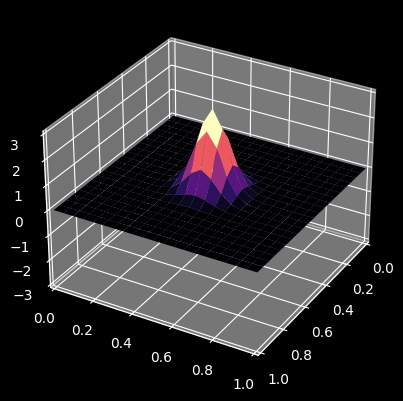

In [14]:
def animate():
    X=np.linspace(xmin,xmax,len(U[0,:,0]))
    Y=np.linspace(ymin,ymax,len(U[0,0,:]))
    X, Y =np.meshgrid(X,Y)
    fig=plt.figure()
    ax=plt.axes(projection="3d")

    def update(i):
        ax.clear()
        ax.set_zlim(-3,3)
        ax.set_ylim(0,1)
        ax.set_xlim(0,1)
        Z=U[i*50]
        ax.plot_surface(X,Y,Z,cmap=cm.magma)
        ax.view_init(30,30+0.01*i*50)

    return animation.FuncAnimation(fig, func = update, frames=range(int(len(U)/50)),interval=50)
    
    #ani=animation.FuncAnimation(fig, func = update, frames=range(len(U)/50),interval=10)
    #ani.save("onda2d.mp4", writer="ffmpeg")


animate()

